<a href="https://colab.research.google.com/github/amerajat/Dog_Breed_Classification/blob/main/Dog_Breed.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End to end Multi-Class Dog Breed Classification

This notebook build an end to end multi class image classifier using TensorFlow 2.0 and TensorFlow Hub

## 1. Problem

Identify the breed of dog given an image of a dog. I just want to know what is the dog breed

##2. Data

The data we're using is from Kaggle's dog breed identification competition

##3. Evaluation

The evaluation is a file with prediction probabilities for each dog breed of each test image.

##4. Features

Some information about the data:
* We are dealing with images (unstuctured data) so it is best to use deep learnning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10k + images in the training set (have labels)
* There are around 10k images in the test set ( no labels because we will want to predict them).



In [6]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [7]:
#Unzip the Zip file
#!unzip "drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "drive/My Drive/Dog Vision/"

## Get the workspace ready

In [8]:
# # upgrade TF
# try:
#   # %tensorflow_version only exist in Colab
#   %tensor_flow 2.x
# except Exception
#   pass

In [9]:
## import neccessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version", tf.__version__)
print("TF Hub version",hub.__version__)

# Check for GPU
print("GPU", "avaiable"
if tf.config.list_physical_devices ("GPU") else "not available")

TF version 2.9.2
TF Hub version 0.12.0
GPU avaiable


## Getting the data ready

In [10]:
# checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
labels_csv.head()

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [11]:
# How many images are there of each breed
labels_csv["breed"].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

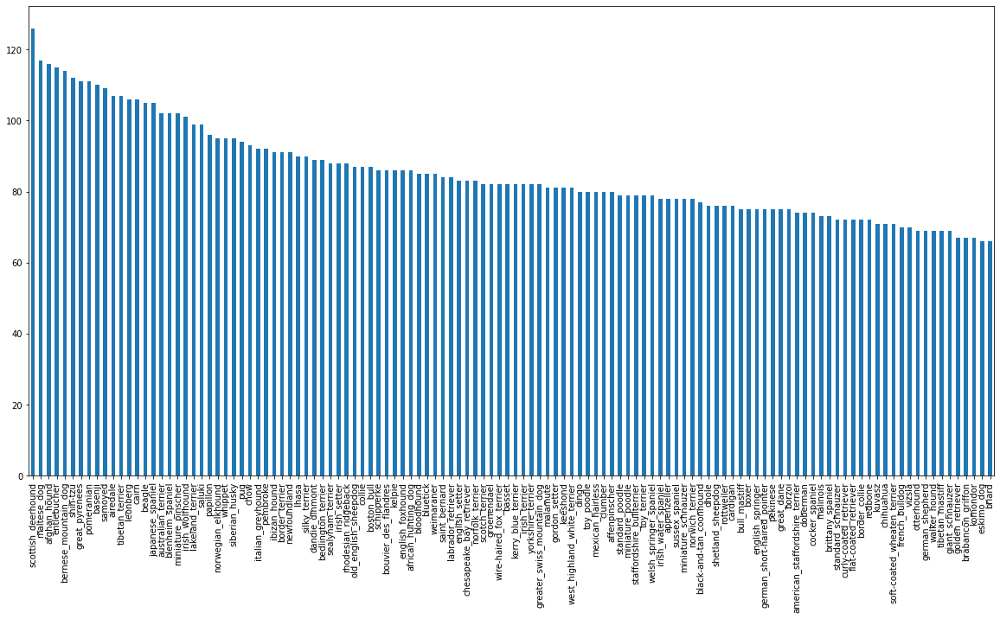

In [12]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [13]:
labels_csv["breed"].value_counts().mean()

85.18333333333334

In [14]:
labels_csv["breed"].value_counts().median()

82.0

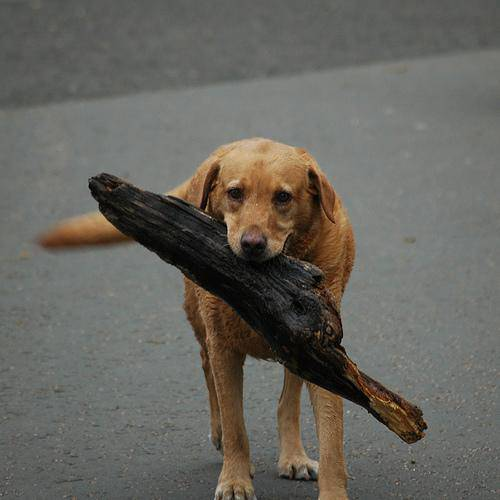

In [15]:
# View the image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg")


### images and the label
with the image id's and the label in a DataFrame(label.csv), we will create:

* A list a filepaths to training images
* An array of all labels
* An array of all unique labels



#### A list a filepaths to training images
working with filepaths is more efficient than working with the images

In [16]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [17]:
# Create filename from image ID's
filenames =[fname for fname in labels_csv["id"]]

#Check the filenames
filenames[:10]

['000bec180eb18c7604dcecc8fe0dba07',
 '001513dfcb2ffafc82cccf4d8bbaba97',
 '001cdf01b096e06d78e9e5112d419397',
 '00214f311d5d2247d5dfe4fe24b2303d',
 '0021f9ceb3235effd7fcde7f7538ed62',
 '002211c81b498ef88e1b40b9abf84e1d',
 '00290d3e1fdd27226ba27a8ce248ce85',
 '002a283a315af96eaea0e28e7163b21b',
 '003df8b8a8b05244b1d920bb6cf451f9',
 '0042188c895a2f14ef64a918ed9c7b64']

In [18]:
# Create pathname from image ID's
filenames =["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]

#Check the first 10
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [19]:
# Check if the filenames equal to the number of images
import os
os.listdir("drive/MyDrive/Dog Vision/train/")[:10]

['e7ab11f849e895ced3cdddf4d90e5bd2.jpg',
 'e7ab74acdc860dfb93271901da085ffd.jpg',
 'e7af30693df78697b8541fb5e2e46941.jpg',
 'e7af8f590b4fbdca0779f5e606ef91a1.jpg',
 'e7bc17ef352ef576b73467ebe9a407f1.jpg',
 'e7c5692d044250d303a839d989132bf1.jpg',
 'e7f2f67cb616281a89fc77a6bdea6eb0.jpg',
 'e7f3274adaad369068602a422e9df192.jpg',
 'e7f491cb903ff0a294eb63c625ef090e.jpg',
 'e7f4f3c25291884f2dfe7c60051d6949.jpg']

In [20]:
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("filenames and images matched")
else:
  print("filenames and images do not match, please check the directory")

filenames and images matched


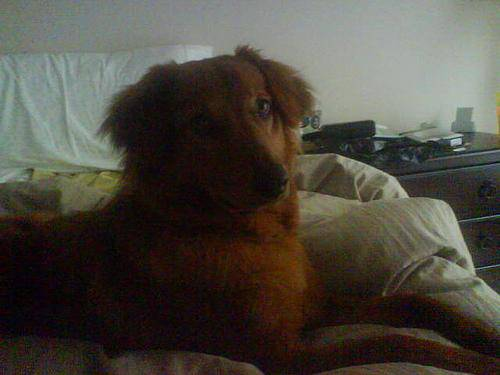

In [21]:
Image(filenames[1000])

In [22]:
labels_csv["breed"][1000]

'irish_setter'

the training image filepaths is now in a list we are now going to do the:
* An array of all labels
* An array of all unique labels

#### An array of all labels

In [23]:
import numpy as np
labels = labels_csv["breed"].to_numpy() # convert labels column to NumPy array
labels[:10]

##another way to convert to numpy array
#labels = np.array(labels)
#labels

array(['boston_bull', 'dingo', 'pekinese', 'bluetick', 'golden_retriever',
       'bedlington_terrier', 'bedlington_terrier', 'borzoi', 'basenji',
       'scottish_deerhound'], dtype=object)

In [24]:
# Check if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filenames!")
else:
  print("Number of labels does not match number of filenames, check data directories.")

Number of labels matches number of filenames!


the training image filepaths is now in a list and labels is in array, we are now going to do the:
* An array of all unique labels



#### An array of all unique labels
before we can turn the string to numbers we will find the unique dog breed names

In [25]:
# Find the unique label values
unique_breeds = np.unique(labels)
len(unique_breeds)


120

In [26]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [27]:
# Example: Turn one label into an array of booleans
print(labels[0])
labels[0] == unique_breeds # compare labels variable with unique_breeds variable

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [28]:
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [29]:
# Turn every label into a boolean array
boolean_labels = [label == np.array(unique_breeds) for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [30]:
len(boolean_labels)

10222

In [31]:
len(labels)

10222

In [32]:
# Example: Turning a boolean array into integers
print(labels[0]) # original label
print(np.where(unique_breeds == labels[0])[0][0]) # index where label occurs
print(boolean_labels[0].argmax()) # index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be a 1 where the sample label occurs

boston_bull
19
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [33]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [34]:
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

The labels is now in numeric and the image filepaths can be access easier than before, it is time to split the data

### Creating validation set

In [35]:
X = filenames
y = boolean_labels

In [36]:
len(boolean_labels)

10222

experimetning with 10222 images from the get go will take alot of time We will start with 1k images and increase as needed

In [37]:
# Set the number of images to be use in experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10222}

In [38]:
# Split the data into train and validation set
from sklearn.model_selection import train_test_split

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                   y[:NUM_IMAGES],
                                                   test_size=0.2,
                                                   random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [39]:
# checking the data
X_train[:2]

['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
 'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg']

In [40]:
y_train[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False,  True,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

## Preprocessing the images
To preprocess the images into Tensor, there are few functions need to be written that will do:

1. Take an image filepath as input
2. Use tensorflow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensor
4. Normalize the image (convert the color channel values from 0 -255 into 0-1)
5. Resize the `image` to be a shape of (244,244)
6. Return the modified `image`

let see what imported image look like

In [41]:
# Convert image to Numpy
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [42]:
image.max(), image.min()

(255, 0)

In [43]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [44]:
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

Now, let's create a function to preprocess them

In [45]:
# Define image size
IMG_SIZE = 224

def process_image(image_path):
  """
  Takes an image file path and turns it into a Tensor.
  """
  # Read in image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-225 values to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired size (224, 244)
  image = tf.image.resize(image, size=[IMG_SIZE, IMG_SIZE])
  return image

## Turning the data into batches

we are going to use the general size of batch size that is 32 which is suitable for a GPU memory. The data need to be in a form of Tensors tuples look like this `(image,label)`

In [46]:
# test - return label in tensor form
# def process_label(label):
#   label = (tf.constant(label))
#   return label

In [47]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label).
  """
  image = process_image(image_path)
  #label = process_label(label) # test - return label in tensor form
  return image, label

In [48]:
# Demo of the above
(process_image(X[42]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

In [49]:
# Define the batch size, starting from batch size = 32
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (x) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle it if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only filepaths
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  
  # If the data if a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                               tf.constant(y))) # labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    # If the data is a training dataset, we shuffle it
    print("Creating training data batches...")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), # filepaths
                                              tf.constant(y))) # labels
    
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size=len(x))

    # Create (image, label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch

In [50]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches...
Creating validation data batches...


In [51]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

In [52]:
## Visualizing Data Batches
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays 25 images from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(10, 10))
  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn gird lines off
    plt.axis("off")

In [53]:
# Visualize training images from the training data batch
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

In [54]:
train_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

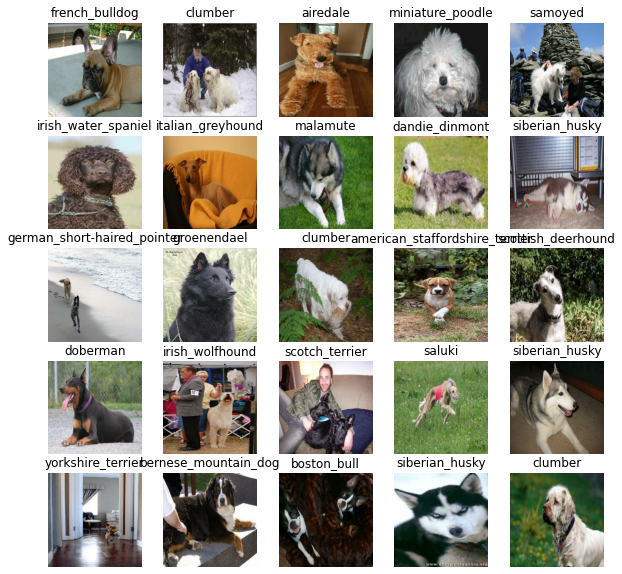

In [55]:
show_25_images(train_images, train_labels)

In [56]:
# Visualize validation images from the validation data batch
val_images, val_labels = next(val_data.as_numpy_iterator())
len(val_images), len(val_labels)

(32, 32)

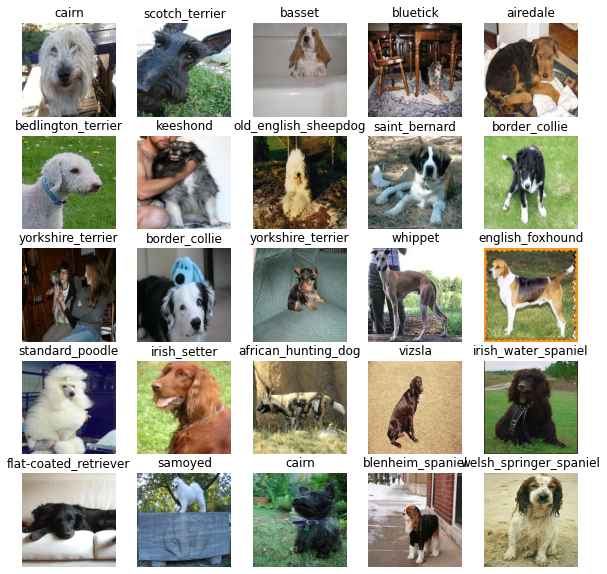

In [57]:
show_25_images(val_images, val_labels)

## Building a Model
Let's define few things before building a model:
* The input shape (the image shape, in Tensors form)
* The output shape (the labels shape, in Tensors from)
* The URL of the model we awnt to use from TensorFlow Hub

In [58]:
# Setup the input shape to the model
INPUT_SHAPE = (None, IMG_SIZE, IMG_SIZE, 3) # (batch, height, width, colour channels)

# Setup the output shape to the model
OUTPUT_SHAPE = len(unique_breeds)

# Setup the model URL from TF hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [59]:
# Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
    hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
    tf.keras.layers.Dense(units=OUTPUT_SHAPE, 
                          activation="softmax") # Layer 2 (output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(), # Our model wants to reduce this (how wrong its guesses are)
      optimizer=tf.keras.optimizers.Adam(), #  how our model improve its guesses
      metrics=["accuracy"] # We'd like this to go up
  )

  # Build the model
  model.build(INPUT_SHAPE) # Let the model know what kind of inputs it'll be getting
  
  return model

In [60]:
# Create a model and check its details
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


## Callbacks

There will be two callbacks, that is:
* TensorBoard - which helps track the model progress
* early stopping - which stops the training when  the model stop improving so the training wont take too long

### TensorBoard Callbacks
To setup TensorBoard callback, we need to do 3 things:
1. Load the TensorBoard notebook extension.
2. Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function.
3. Visualize the our models training logs using the %tensorboard magic function (we'll do this later on).

#### TensorBoard Callbacks-  Load the TensorBoard notebook extension.

In [61]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

#### TensorBoard Callbacks - Create a TensorBoard callback function

In [62]:
import datetime

# Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                        # Make it so the logs get tracked whenever we run an experiment
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### EarlyStopping callbacks

In [63]:
# Create early stopping (once our model stops improving, stop training)
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                  patience=3) # stops after 3 rounds of no improvements

## Training a model 

there will a more than one model, but the first one will be train on only 1000 images to make sure everythihg else is working

In [64]:
# How many rounds should we get the model to look through the data?
NUM_EPOCHS = 100 #@param {type:"slider", min:10, max:100, step:10}

Let's create a simple function which trains a model. The function will:

* Create a model using create_model().
* Setup a TensorBoard callback using create_tensorboard_callback() (we do this here so it creates a log directory of the current date and time).
* Call the fit() function on our model passing it the training data, validatation data, number of epochs to train for and the callbacks we'd like to use.
* Return the fitted model.

In [65]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1, # check validation metrics every epoch
            callbacks=[tensorboard, early_stopping])
  
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 239s 9s/step - loss: 4.5035 - accuracy: 0.1000 - val_loss: 3.4486 - val_accuracy: 0.1950
Epoch 2/100
25/25 [==============================] - 4s 158ms/step - loss: 1.6054 - accuracy: 0.6875 - val_loss: 2.1551 - val_accuracy: 0.4700
Epoch 3/100
25/25 [==============================] - 4s 158ms/step - loss: 0.5537 - accuracy: 0.9450 - val_loss: 1.6619 - val_accuracy: 0.5650
Epoch 4/100
25/25 [==============================] - 4s 158ms/step - loss: 0.2495 - accuracy: 0.9837 - val_loss: 1.4946 - val_accuracy: 0.6150
Epoch 5/100
25/25 [==============================] - 4s 159ms/step - loss: 0.1470 - accuracy: 0.9962 - val_loss: 1.4047 - val_accuracy: 0.6050
Epoch 6/100
25/25 [==============================] - 3s 132ms/step - loss: 0.1008 - accuracy: 0.9975 - val_loss: 1.3520 - val_accuracy: 0.6450
Epoch 7/100
25/25 [==============================]

### Check the TensorBoard logs

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Make and Evalaute predictions using a trained model

In [66]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions = model.predict(val_data, verbose=1) # verbose shows us how long there is to go
predictions

7/7 [==============================] - 2s 110ms/step


array([[8.6266338e-04, 4.8085563e-05, 2.2307327e-03, ..., 9.7676981e-05,
        1.8022305e-05, 1.8068099e-03],
       [4.1946066e-03, 8.6777785e-04, 3.7368566e-02, ..., 8.2183885e-04,
        1.0036717e-03, 9.2010340e-04],
       [9.4003162e-06, 1.5698707e-04, 6.1377928e-06, ..., 7.2241222e-05,
        1.6563714e-05, 2.3436757e-04],
       ...,
       [2.6537899e-07, 1.0649224e-05, 6.5120557e-06, ..., 2.5163285e-06,
        4.0025465e-05, 2.0132251e-05],
       [2.0743196e-03, 2.5938952e-04, 1.4380585e-04, ..., 1.9451996e-04,
        4.4704186e-05, 3.3434923e-03],
       [1.7163144e-04, 1.0655106e-05, 3.4270078e-04, ..., 1.7284409e-03,
        8.9508685e-04, 2.8632534e-05]], dtype=float32)

In [ ]:
# Check the shape of predictions
predictions.shape # 200 of y_val and 120 of unique_breed

(200, 120)

In [ ]:
# First prediction
print(predictions[0])
print(f"Max value (probability of prediction): {np.max(predictions[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(predictions[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(predictions[0])}") # the index of where the max value in predictions[0] occurs
print(f"Predicted label: {unique_breeds[np.argmax(predictions[0])]}") # the predicted label

[8.62663379e-04 4.80855633e-05 2.23073270e-03 1.49921707e-05
 2.84752226e-04 4.97914152e-05 1.04723647e-02 8.36762410e-05
 3.79116900e-05 2.70567834e-04 2.96581653e-04 3.51378520e-04
 1.48957377e-04 6.07741385e-05 7.42567354e-04 7.63049116e-04
 1.78452046e-05 1.38050616e-01 2.73330570e-05 1.76012418e-05
 4.48253501e-04 5.02876683e-05 3.48538524e-05 6.03931025e-04
 2.06299283e-05 1.82864766e-04 4.37463880e-01 1.69495062e-04
 2.74913502e-04 3.79122910e-04 8.19057386e-05 4.37678362e-04
 2.11682549e-04 1.70388648e-05 1.91336658e-05 4.36282670e-03
 1.24618700e-05 5.97395236e-04 1.25814826e-04 3.69496847e-05
 2.81252689e-03 3.64360312e-05 8.31199868e-05 2.93160905e-04
 5.81132463e-06 5.79154766e-05 6.45425371e-06 1.76336180e-05
 1.01178582e-03 1.07383676e-05 1.04268744e-04 1.56661445e-05
 5.41940317e-05 1.53446854e-05 5.72212011e-05 2.88804495e-05
 4.96779576e-05 1.08999142e-03 4.78866314e-05 3.12178135e-02
 9.23207117e-05 1.29969576e-05 7.20256881e-04 1.02005593e-04
 1.51588058e-04 1.501207

The result above show the prediction probabilities of the image to the label. To better understand the prediction probabilities, it is better to convert it into the true label and it's original image

In [67]:
# Create a function to turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]



In [ ]:
# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

'cairn'

In order to visualize the image and the true label, it is necessary to unbatch the image in the batch dataset 'val_data' and get the image inside the batch data then we will compare the validation images with the validation labels (true labels)

In [ ]:
# image in the val_data that is in batch dataset form
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [68]:
# Create a function to unbatch a batched dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns separate arrays
  of images and labels.
  """
  images = []
  labels = []
  # Loop through unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels



In [ ]:
# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0]

array([[[0.29599646, 0.43284872, 0.3056691 ],
        [0.26635826, 0.32996926, 0.22846507],
        [0.31428418, 0.27701408, 0.22934894],
        ...,
        [0.77614343, 0.82320225, 0.8101595 ],
        [0.81291157, 0.8285351 , 0.8406944 ],
        [0.8209297 , 0.8263737 , 0.8423668 ]],

       [[0.2344871 , 0.31603682, 0.19543913],
        [0.3414841 , 0.36560842, 0.27241898],
        [0.45016077, 0.40117094, 0.33964607],
        ...,
        [0.7663987 , 0.8134138 , 0.81350833],
        [0.7304248 , 0.75012016, 0.76590735],
        [0.74518913, 0.76002574, 0.7830809 ]],

       [[0.30157745, 0.3082587 , 0.21018331],
        [0.2905954 , 0.27066195, 0.18401104],
        [0.4138316 , 0.36170745, 0.2964005 ],
        ...,
        [0.79871625, 0.8418535 , 0.8606443 ],
        [0.7957738 , 0.82859945, 0.8605655 ],
        [0.75181633, 0.77904975, 0.8155256 ]],

       ...,

       [[0.9746779 , 0.9878955 , 0.9342279 ],
        [0.99153054, 0.99772066, 0.9427856 ],
        [0.98925114, 0

In [ ]:
val_labels[0]

'cairn'

Now visualization will be done using:
* Prediction labels
* Validation labels
* Validation images

The first function we'll create will:

* Take an array of prediction probabilities, an array of truth labels, an array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and target image on a single plot.

In [69]:

# Create a visualization function
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth label and image for sample n.
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]
  
  # Get the pred label
  pred_label = get_pred_label(pred_prob)
  
  # Plot image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% ({})".format(pred_label,
                                      np.max(pred_prob)*100,
                                      true_label),
                                      color=color)

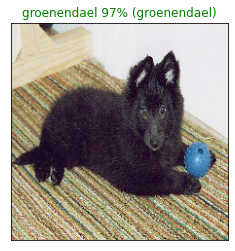

In [ ]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=77)

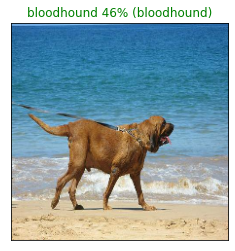

In [ ]:
# View an example prediction, original image and truth label
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images,
          n=100)

Let look at top 10 highest prediction probabilities for an image. A fucntion will be created and will be able to:
* Take an input of a prediction probabilities array, a ground truth labels array and an integer.
* Find the predicted label using `get_pred_label()`.
* Find the top 10:
    * Prediction probabilities indexes
    * Prediction probabilities values
    * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green.

In [70]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plots the top 10 highest prediction confidences along with
  the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)), 
                     top_10_pred_values, 
                     color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  # Change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

In [ ]:
predictions[0]

array([8.62663379e-04, 4.80855633e-05, 2.23073270e-03, 1.49921707e-05,
       2.84752226e-04, 4.97914152e-05, 1.04723647e-02, 8.36762410e-05,
       3.79116900e-05, 2.70567834e-04, 2.96581653e-04, 3.51378520e-04,
       1.48957377e-04, 6.07741385e-05, 7.42567354e-04, 7.63049116e-04,
       1.78452046e-05, 1.38050616e-01, 2.73330570e-05, 1.76012418e-05,
       4.48253501e-04, 5.02876683e-05, 3.48538524e-05, 6.03931025e-04,
       2.06299283e-05, 1.82864766e-04, 4.37463880e-01, 1.69495062e-04,
       2.74913502e-04, 3.79122910e-04, 8.19057386e-05, 4.37678362e-04,
       2.11682549e-04, 1.70388648e-05, 1.91336658e-05, 4.36282670e-03,
       1.24618700e-05, 5.97395236e-04, 1.25814826e-04, 3.69496847e-05,
       2.81252689e-03, 3.64360312e-05, 8.31199868e-05, 2.93160905e-04,
       5.81132463e-06, 5.79154766e-05, 6.45425371e-06, 1.76336180e-05,
       1.01178582e-03, 1.07383676e-05, 1.04268744e-04, 1.56661445e-05,
       5.41940317e-05, 1.53446854e-05, 5.72212011e-05, 2.88804495e-05,
      

In [ ]:
predictions[0].argsort()[-10:][::-1]

array([ 26,  17, 103, 102,  59, 100,  79,  83,  70, 109])

In [ ]:
predictions[0][predictions[0].argsort()[-10:][::-1]]

array([0.43746388, 0.13805062, 0.1192691 , 0.0832713 , 0.03121781,
       0.02418343, 0.02211092, 0.01992202, 0.01674447, 0.01541066],
      dtype=float32)

In [ ]:
predictions[0].max()

0.43746388

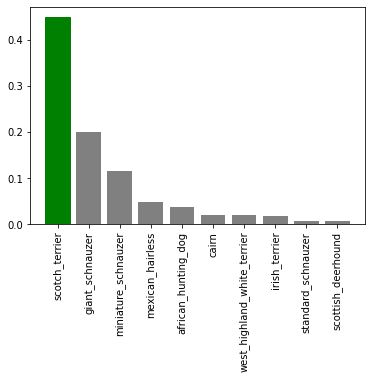

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=1)

Visualizing a few predictions using the `plot_pred_conf()`

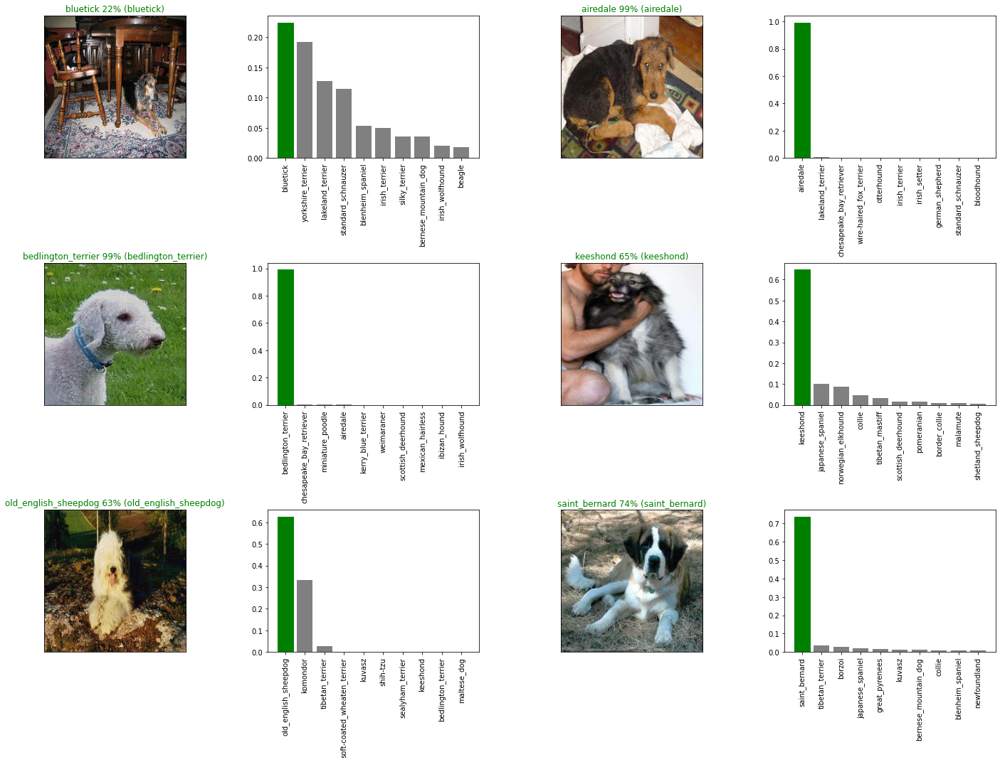

In [ ]:
# Let's check a few predictions and their different values
i_multiplier = 3
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(5*2*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                labels=val_labels,
                n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and loading a Trained model

In [71]:
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (str)
  for clarity and reuse.
  """
  # Create model directory with current time
  modeldir = os.path.join("drive/My Drive/Dog Vision/models",
                          datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix + ".h5" # save format of model
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [72]:
def load_model(model_path):
  """
  Loads a saved model from a specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects={"KerasLayer":hub.KerasLayer})# we are setting this custom object because we use model from TF hub
  return model

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20221019-03411666150894-1000-images-Adam.h5...


'drive/My Drive/Dog Vision/models/20221019-03411666150894-1000-images-Adam.h5'

In [73]:
# Load our model trained on 1000 images
model_1000_images = load_model('drive/My Drive/Dog Vision/models/20221018-11301666092600-1000-images-Adam.h5')

Loading saved model from: drive/My Drive/Dog Vision/models/20221018-11301666092600-1000-images-Adam.h5


In [74]:
# Evaluate the pre-saved model
model.evaluate(val_data)

KeyboardInterrupt: ignored

In [ ]:
model_1000_images.evaluate(val_data)

7/7 [==============================] - 1s 96ms/step - loss: 1.3022 - accuracy: 0.6500


[1.3021584749221802, 0.6499999761581421]

## Train the model on full data

In [75]:
len(X), len(y)

(10222, 10222)

In [76]:
len(X_train)

800

In [77]:
# Create a data batch with the full data

full_data = create_data_batches(X,y)

Creating training data batches...


In [78]:
full_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [79]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [80]:
# Create full model callback
full_model_tensorboard = create_tensorboard_callback()

# No validation set when training on all the data, so we can't modenitor validation accuaracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                             patience = 3)

In [ ]:
# Fit the model with the full data
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 44s 122ms/step - loss: 1.3337 - accuracy: 0.6744
Epoch 2/100
320/320 [==============================] - 41s 127ms/step - loss: 0.4029 - accuracy: 0.8790
Epoch 3/100
320/320 [==============================] - 39s 122ms/step - loss: 0.2357 - accuracy: 0.9354
Epoch 4/100
320/320 [==============================] - 41s 128ms/step - loss: 0.1520 - accuracy: 0.9646
Epoch 5/100
320/320 [==============================] - 41s 129ms/step - loss: 0.1046 - accuracy: 0.9797
Epoch 6/100
320/320 [==============================] - 40s 126ms/step - loss: 0.0778 - accuracy: 0.9861
Epoch 7/100
320/320 [==============================] - 44s 138ms/step - loss: 0.0588 - accuracy: 0.9908
Epoch 8/100
320/320 [==============================] - 45s 139ms/step - loss: 0.0474 - accuracy: 0.9945
Epoch 9/100
320/320 [==============================] - 43s 134ms/step - loss: 0.0374 - accuracy: 0.9962
Epoch 10/100
320/320 [==============================] - 43s 134m

In [ ]:
# Save model to file
#save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/My Drive/Dog Vision/models/20221019-04001666152020-full-image-set-mobilenetv2-Adam.h5...


'drive/My Drive/Dog Vision/models/20221019-04001666152020-full-image-set-mobilenetv2-Adam.h5'

In [81]:
loaded_full_model = load_model('drive/My Drive/Dog Vision/models/20221019-04001666152020-full-image-set-mobilenetv2-Adam.h5')

Loading saved model from: drive/My Drive/Dog Vision/models/20221019-04001666152020-full-image-set-mobilenetv2-Adam.h5


## Making prediction on the test data
To do prediction, the test data need to be the same format as the images in the Tensor Batches

To make predictions on the test data, we'll:

* Get the test image filenames.
* Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since there are no labels with the test images).
* Make a predictions array by passing the test data batches to the predict() function.

In [82]:
# Load test image filenames (since we're using os.listdir(), these already have .jpg)
test_path = "drive/My Drive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]


In [83]:
test_filenames[:10]

['drive/My Drive/Dog Vision/test/8ead441b5308c4717d2f2420a4d00f70.jpg',
 'drive/My Drive/Dog Vision/test/8ea1c9c721698b2173bccd612fd948ea.jpg',
 'drive/My Drive/Dog Vision/test/8eb2d59b4f612268811fb7bb8daeb676.jpg',
 'drive/My Drive/Dog Vision/test/8eb46c1b8e2915a68706b118868e52ef.jpg',
 'drive/My Drive/Dog Vision/test/8ef652e3a8e720c288bdd74b20f32070.jpg',
 'drive/My Drive/Dog Vision/test/8ed8f1a59a47660bc47b27d4c8210212.jpg',
 'drive/My Drive/Dog Vision/test/8efffdbfd471a6f6841f0dcf8bf5652d.jpg',
 'drive/My Drive/Dog Vision/test/8ef205befc91705986ec7d410c781c2a.jpg',
 'drive/My Drive/Dog Vision/test/8f0b8518c478bf8654a8333355363243.jpg',
 'drive/My Drive/Dog Vision/test/8f0afee5014fa576e144445d2d0b3ea8.jpg']

In [84]:
# How many test images are there?
len(test_filenames)

10357

In [85]:
# Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [86]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [87]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                             verbose=1)

324/324 [==============================] - 44s 134ms/step


In [88]:
# Check out the test predictions
test_predictions[:10]

array([[1.2443255e-07, 4.9841820e-10, 8.3151858e-10, ..., 8.9372634e-09,
        2.0208495e-07, 8.9407752e-09],
       [2.1752959e-09, 9.7203823e-10, 1.1662984e-10, ..., 8.3486623e-01,
        5.4815126e-07, 2.2037268e-09],
       [5.8087098e-11, 1.7349857e-12, 1.0041257e-05, ..., 1.5028885e-05,
        4.3181881e-06, 9.4940596e-08],
       ...,
       [1.3033819e-07, 2.3979860e-09, 1.0517918e-11, ..., 6.6662347e-14,
        8.8879154e-11, 3.0143530e-09],
       [7.6831288e-09, 7.8790748e-07, 3.7214329e-12, ..., 4.2380700e-12,
        5.6978990e-09, 5.8745835e-11],
       [1.6442772e-08, 4.2289095e-08, 1.0241326e-11, ..., 2.6171778e-09,
        8.5954346e-09, 3.4545053e-08]], dtype=float32)

In [89]:
#Save predictions
#np.savetxt("drive/My Drive/Dog Vision/preds_array.csv",test_predictions, delimiter=",")

In [91]:
#Load predictions from csv file
#test_predictions = np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv", delimiter=",")

In [92]:
test_predictions.shape

(10357, 120)

In [93]:
test_predictions[:10]

array([[1.24432546e-07, 4.98418196e-10, 8.31518576e-10, ...,
        8.93726337e-09, 2.02084948e-07, 8.94077523e-09],
       [2.17529594e-09, 9.72038228e-10, 1.16629845e-10, ...,
        8.34866226e-01, 5.48151263e-07, 2.20372676e-09],
       [5.80870976e-11, 1.73498574e-12, 1.00412572e-05, ...,
        1.50288852e-05, 4.31818808e-06, 9.49405958e-08],
       ...,
       [1.30338194e-07, 2.39798603e-09, 1.05179181e-11, ...,
        6.66623468e-14, 8.88791540e-11, 3.01435299e-09],
       [7.68312880e-09, 7.87907481e-07, 3.72143288e-12, ...,
        4.23806996e-12, 5.69789904e-09, 5.87458346e-11],
       [1.64427725e-08, 4.22890949e-08, 1.02413260e-11, ...,
        2.61717781e-09, 8.59543459e-09, 3.45450530e-08]])

## Preparing tesst dataset predictions for Kaggle submission

The format for Kaggle submission is:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns using the unique_breeds list and the test_predictions list.
* Export the DataFrame as a CSV to submit it to Kaggle.

In [95]:
["id"]+list(unique_breeds)

['id',
 'affenpinscher',
 'afghan_hound',
 'african_hunting_dog',
 'airedale',
 'american_staffordshire_terrier',
 'appenzeller',
 'australian_terrier',
 'basenji',
 'basset',
 'beagle',
 'bedlington_terrier',
 'bernese_mountain_dog',
 'black-and-tan_coonhound',
 'blenheim_spaniel',
 'bloodhound',
 'bluetick',
 'border_collie',
 'border_terrier',
 'borzoi',
 'boston_bull',
 'bouvier_des_flandres',
 'boxer',
 'brabancon_griffon',
 'briard',
 'brittany_spaniel',
 'bull_mastiff',
 'cairn',
 'cardigan',
 'chesapeake_bay_retriever',
 'chihuahua',
 'chow',
 'clumber',
 'cocker_spaniel',
 'collie',
 'curly-coated_retriever',
 'dandie_dinmont',
 'dhole',
 'dingo',
 'doberman',
 'english_foxhound',
 'english_setter',
 'english_springer',
 'entlebucher',
 'eskimo_dog',
 'flat-coated_retriever',
 'french_bulldog',
 'german_shepherd',
 'german_short-haired_pointer',
 'giant_schnauzer',
 'golden_retriever',
 'gordon_setter',
 'great_dane',
 'great_pyrenees',
 'greater_swiss_mountain_dog',
 'groenen

In [96]:
# Create pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [98]:
test_filenames

['drive/My Drive/Dog Vision/test/8ead441b5308c4717d2f2420a4d00f70.jpg',
 'drive/My Drive/Dog Vision/test/8ea1c9c721698b2173bccd612fd948ea.jpg',
 'drive/My Drive/Dog Vision/test/8eb2d59b4f612268811fb7bb8daeb676.jpg',
 'drive/My Drive/Dog Vision/test/8eb46c1b8e2915a68706b118868e52ef.jpg',
 'drive/My Drive/Dog Vision/test/8ef652e3a8e720c288bdd74b20f32070.jpg',
 'drive/My Drive/Dog Vision/test/8ed8f1a59a47660bc47b27d4c8210212.jpg',
 'drive/My Drive/Dog Vision/test/8efffdbfd471a6f6841f0dcf8bf5652d.jpg',
 'drive/My Drive/Dog Vision/test/8ef205befc91705986ec7d410c781c2a.jpg',
 'drive/My Drive/Dog Vision/test/8f0b8518c478bf8654a8333355363243.jpg',
 'drive/My Drive/Dog Vision/test/8f0afee5014fa576e144445d2d0b3ea8.jpg',
 'drive/My Drive/Dog Vision/test/8f0c59a69ee53ea445062d1428f494af.jpg',
 'drive/My Drive/Dog Vision/test/8f2a946bfa3aa40374272d35589ff8cb.jpg',
 'drive/My Drive/Dog Vision/test/8f1f7d57584552d193b1e70f10846247.jpg',
 'drive/My Drive/Dog Vision/test/8f2a68b096ec0c3e386a5cd401def80

In [97]:
test_path

'drive/My Drive/Dog Vision/test/'

In [102]:
os.path.splitext(test_filenames[0])

('drive/My Drive/Dog Vision/test/8ead441b5308c4717d2f2420a4d00f70', '.jpg')

In [103]:
# Append test image ID's to predictions DataFrame
#test_path = "drive/My Drive/Dog Vision/test/"
preds_df["id"] = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,8ead441b5308c4717d2f2420a4d00f70,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,8ea1c9c721698b2173bccd612fd948ea,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,8eb2d59b4f612268811fb7bb8daeb676,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,8eb46c1b8e2915a68706b118868e52ef,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,8ef652e3a8e720c288bdd74b20f32070,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [104]:
# Add the prediction probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,8ead441b5308c4717d2f2420a4d00f70,1.244325e-07,4.984182e-10,8.315186e-10,2.270251e-10,8.502420e-08,3.961084e-10,1.176938e-05,3.428719e-10,2.716162e-07,...,8.675074e-07,1.094732e-08,5.539815e-10,1.283138e-10,1.618934e-09,5.938351e-12,2.161606e-08,8.937263e-09,2.020849e-07,8.940775e-09
1,8ea1c9c721698b2173bccd612fd948ea,2.175296e-09,9.720382e-10,1.166298e-10,1.169314e-10,2.957401e-05,2.729028e-07,1.364009e-10,8.269419e-09,1.663954e-10,...,1.401074e-08,1.271486e-05,3.468966e-09,4.531502e-07,1.234462e-07,2.183996e-10,1.149643e-10,8.348662e-01,5.481513e-07,2.203727e-09
2,8eb2d59b4f612268811fb7bb8daeb676,5.808710e-11,1.734986e-12,1.004126e-05,7.795489e-04,6.040189e-09,1.647972e-10,2.325425e-05,9.679518e-07,2.161114e-06,...,4.545002e-10,4.514696e-03,1.729785e-04,6.399568e-08,1.312924e-07,1.282028e-06,3.937999e-08,1.502889e-05,4.318188e-06,9.494060e-08
3,8eb46c1b8e2915a68706b118868e52ef,9.710458e-08,1.225330e-10,1.204951e-07,2.537380e-08,5.880047e-01,8.303684e-09,7.671187e-08,2.171902e-07,2.452337e-09,...,1.243267e-07,2.924066e-09,2.838599e-08,3.257639e-07,8.231489e-10,6.412484e-11,4.065491e-09,6.855667e-07,1.207040e-06,6.429800e-08
4,8ef652e3a8e720c288bdd74b20f32070,5.119025e-10,7.952411e-11,4.198847e-13,1.047252e-11,3.121360e-13,2.603884e-12,2.474596e-10,6.555085e-12,1.008147e-07,...,4.325991e-12,1.771054e-12,6.715212e-11,2.721986e-08,6.065925e-11,6.197303e-07,7.026252e-12,1.649417e-15,1.564825e-10,1.737448e-09


In [106]:
preds_df.to_csv("drive/My Drive/Dog Vision/full_submission_1_mobilienetV2_adam.csv",
                 index=False)

## Predict my own dogs images 

In [107]:
# Get custom image filepaths
custom_path = "drive/My Drive/Dog Vision/My dogs images/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [108]:
# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data=True)

Creating test data batches...


In [109]:
# Make predictions on the custom data
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 0s 483ms/step


In [110]:
# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_pred_labels

['pug', 'german_shepherd', 'pomeranian']

In [111]:
# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

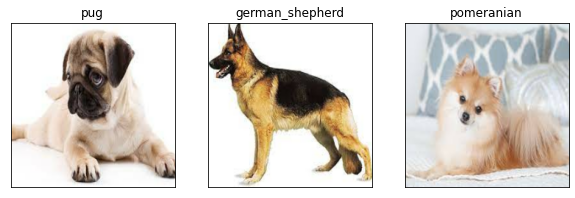

In [112]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(1, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)